Environment: velocity

In [113]:
import pandas
import scanpy
import hdf5plugin
import anndata
import cellrank
import matplotlib
from matplotlib import pyplot
import cellrank
import numpy
import gseapy
import scipy
import seaborn
import scipy
import decoupler
import scvelo
import IPython
import single_cell_analysis
from pyscenic import aucell
import warnings
import numba
import cma
import concurrent.futures
import sklearn

In [2]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

In [3]:
# Plotting setup

figure_size = (5, 5)
fontsize = 14
scanpy.set_figure_params(figsize=figure_size, dpi=100, color_map="plasma", frameon=True, fontsize=fontsize)
pyplot.rcParams.update({"axes.grid": False})
warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Load data from Cellrank and SDEvelo

working_directory = "RNA Sequencing Data/"
base_name = "cellrank"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)
adata.obs["group"] = adata.obs["group"].cat.reorder_categories(["MEF", "mESC", "control", "Hic2"])

adata_raw = adata.raw.to_adata()

In [5]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [6]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [7]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()

In [8]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

# Differentially expressed targets that are drivers of dead end
de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)

# Differentially expressed targets that are drivers of stem cells
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

In [ ]:
# Read parameter values

variable_names = ["Hic2", "Klf4", "Myc", "Keratinocyte", "Stem cell", "Damage"]
parameter_value_df = pandas.read_csv("myc_parameter_values_3.csv")
default_parameters = parameter_value_df["start_value"].to_numpy()
control_parameters = default_parameters.copy()
beta_H_index = 7
control_parameters[beta_H_index] = 0
lower_bounds = parameter_value_df["lower_bound"].to_numpy()
upper_bounds = parameter_value_df["upper_bound"].to_numpy()
n_variables = len(variable_names)
default_parameters_deterministic = default_parameters[:-n_variables]

# Score activities

In [9]:
network_genes = ["Hic2", "Klf4", "Myc"]

In [10]:
# Get gene sets

cell_markers = gseapy.get_library("PanglaoDB_Augmented_2021", organism="Mouse")
epithelial_markers = numpy.array(pandas.Series(cell_markers["Epithelial Cells"]).str.capitalize())
keratinocyte_markers = numpy.array(pandas.Series(cell_markers["Keratinocytes"]).str.capitalize())
stem_cell_markers = numpy.array(pandas.Series(cell_markers["Pluripotent Stem Cells"]).str.capitalize())
fibroblast_markers = numpy.array(pandas.Series(cell_markers["Fibroblasts"]).str.capitalize())
msigdb = gseapy.get_library("MSigDB_Hallmark_2020", organism="Mouse")
p53_markers = numpy.array(pandas.Series(msigdb["p53 Pathway"]).str.capitalize())

In [11]:
# Define gene signatures

dead_end_de_df = pandas.read_csv("RNA Sequencing Data/macrostate_differential_expression_Dead end.csv", index_col=0)

p53_top_1000 = numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index)

signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_top_1000
}

aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_raw.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

In [12]:
# Run AUCell

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata and adata_raw

for gene_set in result.columns:
    adata.obs[f"{gene_set}_score"] = result[gene_set].copy()
    adata_raw.obs[f"{gene_set}_score"] = result[gene_set].copy()

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]

In [13]:
# Score activities of Hic2, Klf4 and Myc

conditions = ["Reprogramming", "MEF", "mESC", "iPSC", "Single-cell"]
lfc_columns = [f"{condition} LFC" for condition in conditions]
pval_columns = [f"{condition} p adjusted" for condition in conditions]

consistently_downregulated_df = bulk_de
for condition in conditions:
    consistently_downregulated_df = consistently_downregulated_df.query(f"`{condition} LFC` < 0")

consistently_downregulated = consistently_downregulated_df.index.to_list()
bulk_chipseq = numpy.intersect1d(consistently_downregulated, hic2_targets)
expression_df = pandas.DataFrame(data = adata.raw.X.toarray(), index=adata.obs_names, columns=adata.raw.var_names)
correlations = expression_df.drop(columns=["Hic2"]).corrwith(expression_df["Hic2"], method="pearson")
bulk_and_correlation = numpy.intersect1d(bulk_chipseq, correlations[correlations < -0.1].index)
weights = bulk_de.loc[bulk_and_correlation]["Single-cell LFC"]
hic2_network = pandas.DataFrame({"source": "Hic2", "weight": weights, "target": bulk_and_correlation})

# Load collectri
collectri_df = decoupler.op.collectri(organism="mouse")
# Remove unreliable signs
modified_collectri = collectri_df.query("sign_decision != 'default activation'")
# Remove autoregulation
modified_collectri = modified_collectri.query("not (source == target)")

# Combine CollecTRI and Hic2 network
collectri_genes = ["Klf4", "Myc"]
myc_klf4_network = modified_collectri.query("source in @collectri_genes")[["source", "target", "weight"]]
network = pandas.concat([hic2_network, myc_klf4_network])

In [14]:
# Run ULM

decoupler.mt.ulm(adata, network, raw=True, bsize=1000000)
network_activities = []
for gene in network_genes:
    adata.obs[f"{gene}_activity"] = adata.obsm["score_ulm"][gene]
    network_activities.append(f"{gene}_activity")

In [15]:
# Rescale scores between 0 and 1

# For AUCell scores, set the max value to 1
for score in network_scores:
    max_value = numpy.max(adata.obs[score])
    adata.obs[score] /= max_value

# For ULM scores, bound them between 0 and 1
for activity in network_activities:
    adata.obs[activity] -= numpy.min(adata.obs[activity])
    adata.obs[activity] /= numpy.max(adata.obs[activity])

# Plotting functions

In [17]:
# Function for plotting concentrations

def plot_concentrations(time_array, concentration_matrix, species_names, species_colors=None):
    n_species = concentration_matrix.shape[0]
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    figure, axis = pyplot.subplots()
    for species_index, species in enumerate(species_names):
        species_color = species_colors[species_index]
        axis.plot(time_array, concentration_matrix[species_index], label=species, color=species_color)
    axis.legend()
    axis.grid(True)
    axis.set_xlabel("Time")
    axis.set_ylabel("Concentration")
    pyplot.show()

In [18]:
# Function for plotting concentrations

def plot_trajectories(time_array, trajectories, species_names, species_colors=None, alpha=1.0, n_columns=3, figure_width=12, row_height=4):
    if len(trajectories.shape) == 2:
        trajectories = trajectories.reshape((1, trajectories.shape[0], trajectories.shape[1]))
    n_species = trajectories.shape[1]
    n_trajectories = trajectories.shape[0]
    n_time_points = len(time_array)
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for species_index, species in enumerate(species_names):
        axis = axes_flat[species_index]
        species_color = species_colors[species_index]
        for trajectory in trajectories[:, species_index].reshape((n_trajectories, n_time_points)):
            # Only plot label for one trajectory

            axis.plot(time_array, trajectory, color=species_color, alpha=alpha)
        axis.grid(True)
        axis.set_title(species)
        axis.set_xlabel("Time")
        axis.set_ylabel("Concentration")
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

# Trends in real time

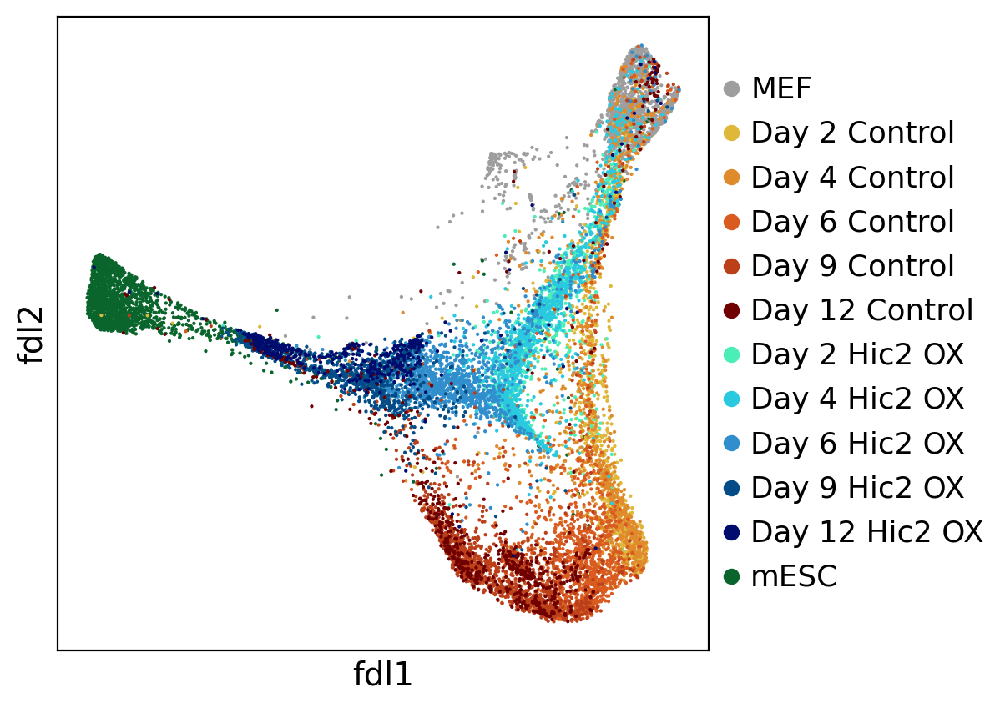

In [20]:
scanpy.pl.embedding(adata, "fdl", color=["sample"], title="")

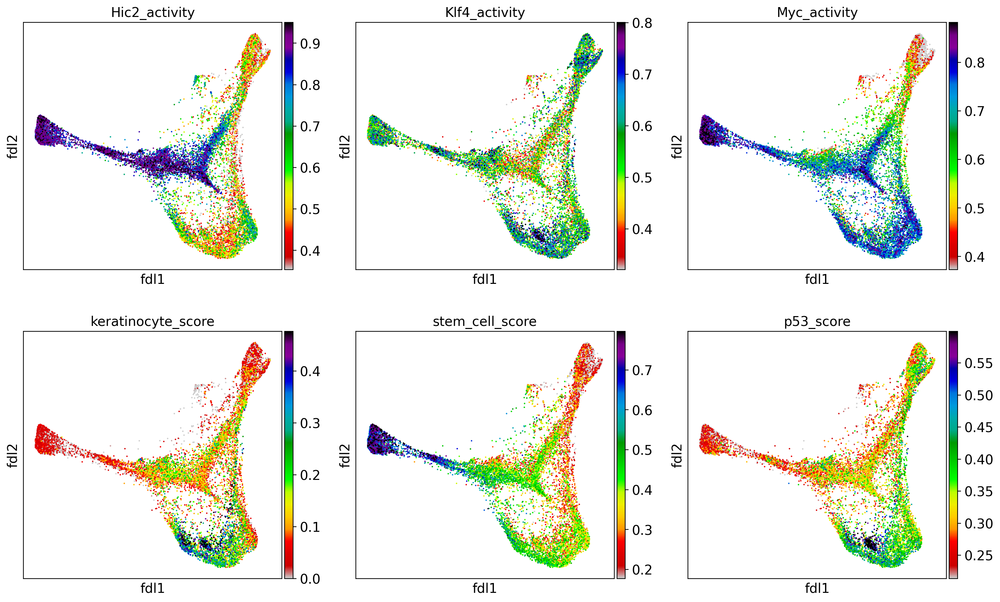

In [23]:
scanpy.pl.embedding(adata, "fdl", color=network_activities+network_scores, cmap="nipy_spectral_r", vmax="p99", vmin="p10", ncols=3)

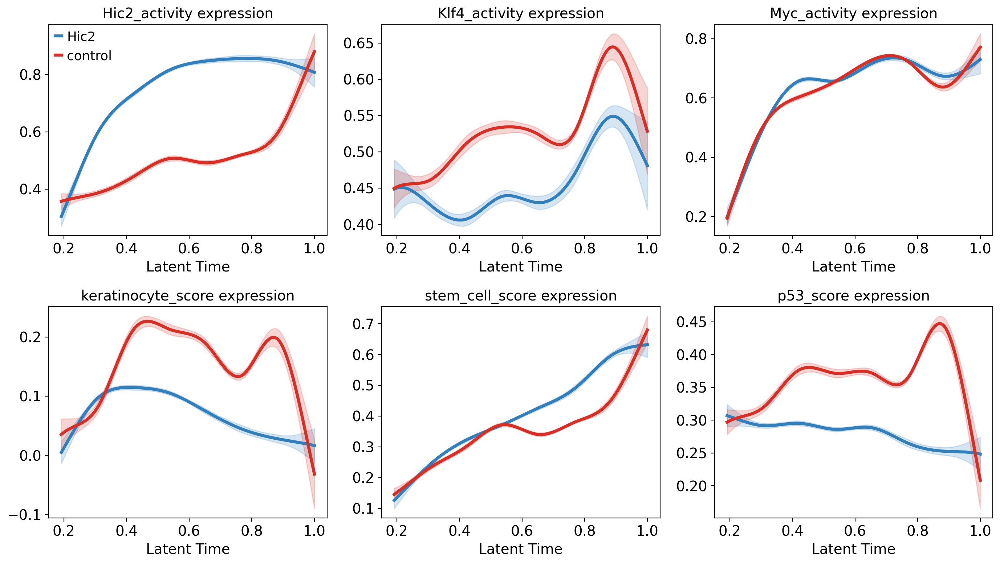

In [24]:
single_cell_analysis.plot_grouped_gene_trend(adata, network_activities+network_scores, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/6 [00:00<?, ?gene/s]

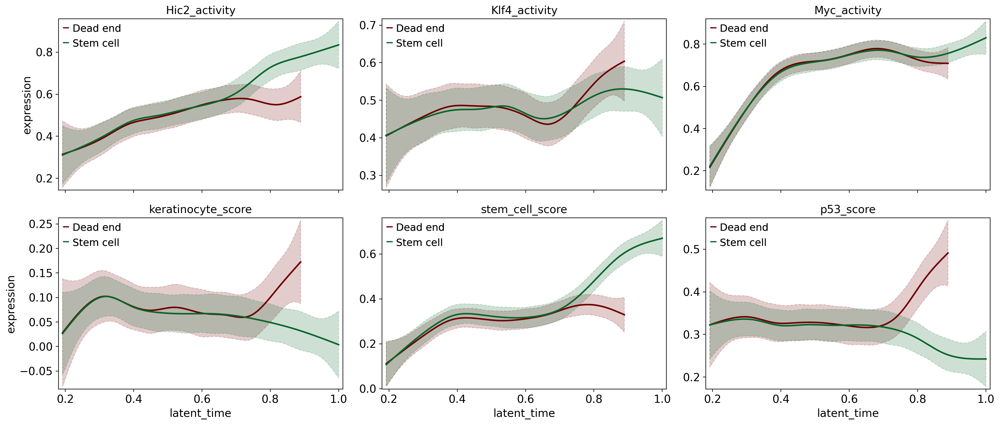

In [25]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_activities+network_scores, group_key="group", groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

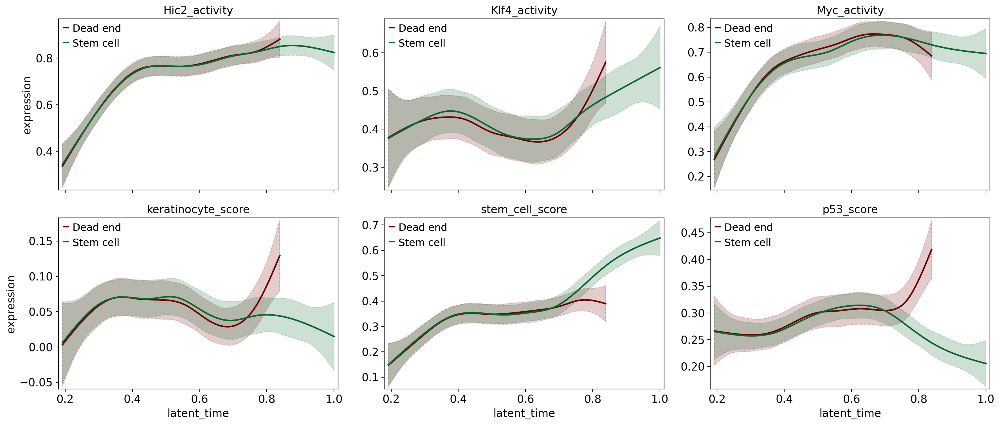

In [26]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_activities+network_scores, group_key="group", groups=["Hic2"], n_knots=10, n_columns=3)

# Functions for integrating stochastic differential equations

In [54]:
# Solver for stochastic differential equations
@numba.njit(nogil=True)
def euler_maruyama(time_array, derivatives_function, initial_values,
                     negatives = True, seed=None, parameters = numpy.empty(0)):
    species = initial_values.size
    dt = time_array[1] - time_array[0]
    concentration_matrix = numpy.zeros((time_array.size, species))
    concentration_matrix[0] = initial_values
    
    if not seed is None:
        numpy.random.seed(seed)
    
    for step_index in range(1, len(time_array)):
        t = time_array[step_index]
        xi = numpy.random.normal()
        concentrations = concentration_matrix[step_index-1]
        dc = derivatives_function(t, concentrations, dt, parameters)
        if negatives:
            new_concentrations = concentrations + dc
        else:
            new_concentrations = numpy.clip(concentrations + dc, a_min=0, a_max=None)
        concentration_matrix[step_index] = new_concentrations.copy()
    return concentration_matrix.T.copy()

In [55]:
@numba.njit(nogil=True)
def derivatives_function_deterministic(time, concentrations, parameters):

    # Concentrations
    H = concentrations[0]
    K = concentrations[1]
    M = concentrations[2]
    E = concentrations[3]
    S = concentrations[4]
    D = concentrations[5]

    # Parameters
    alpha_H = parameters[0]
    alpha_K = parameters[1]
    alpha_M = parameters[2]
    alpha_E = parameters[3]
    alpha_S = parameters[4]
    alpha_MD = parameters[5]
    alpha_DD = parameters[6]
    
    beta_H = parameters[7]
    beta_K = parameters[8]
    beta_M = parameters[9]
    
    delta_H = parameters[10]
    delta_K = parameters[11]
    delta_M = parameters[12]
    delta_E = parameters[13]
    delta_S = parameters[14]
    delta_D = parameters[15]
    
    eta_KH = parameters[16]
    eta_HH = parameters[17]
    eta_MK = parameters[18]
    eta_SK = parameters[19]
    eta_HK = parameters[20]
    eta_KK = parameters[21]
    eta_KM = parameters[22]
    eta_HM = parameters[23]
    eta_MM = parameters[24]
    eta_SM = parameters[25]
    eta_KE = parameters[26]
    eta_EE = parameters[27]
    eta_HE = parameters[28]
    eta_SE = parameters[29]
    eta_KS = parameters[30]
    eta_MS = parameters[31]
    eta_SS = parameters[32]
    eta_ES = parameters[33]
    eta_DS = parameters[34]
    eta_MD = parameters[35]
    eta_HMD = parameters[36]
    eta_DD = parameters[37]
    
    kappa_KH = parameters[38]
    kappa_HH = parameters[39]
    kappa_MK = parameters[40]
    kappa_SK = parameters[41]
    kappa_HK = parameters[42]
    kappa_KK = parameters[43]
    kappa_KM = parameters[44]
    kappa_HM = parameters[45]
    kappa_MM = parameters[46]
    kappa_SM = parameters[47]
    kappa_KE = parameters[48]
    kappa_EE = parameters[49]
    kappa_HE = parameters[50]
    kappa_SE = parameters[51]
    kappa_KS = parameters[52]
    kappa_MS = parameters[53]
    kappa_SS = parameters[54]
    kappa_ES = parameters[55]
    kappa_DS = parameters[56]
    kappa_MD = parameters[57]
    kappa_HMD = parameters[58]
    kappa_DD = parameters[59]

    drift_H = alpha_H * ((K / kappa_KH)**eta_KH) / (1 + (K / kappa_KH)**eta_KH + (H / kappa_HH)**eta_HH) + beta_H - delta_H * H
    
    drift_K = alpha_K * ((M / kappa_MK)**eta_MK + (S / kappa_SK)**eta_SK) / (1 + (M / kappa_MK)**eta_MK + (S / kappa_SK)**eta_SK + (H / kappa_HK)**eta_HK + (K / kappa_KK)**eta_KK) + beta_K - delta_K * K
    
    drift_M = alpha_M * ((K / kappa_KM)**eta_KM) / (1 + (K / kappa_KM)**eta_KM + (H / kappa_HM)**eta_HM + (M / kappa_MM)**eta_MM + (S / kappa_SM)**eta_SM) + beta_M - delta_M * M
    
    drift_E = alpha_E * ((K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE) / (1 + (K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE + (H / kappa_HE)**eta_HE + (S / kappa_SE)**eta_SE) - delta_E * E
    
    drift_S = alpha_S * ((K / kappa_KS)**eta_KS + (M / kappa_MS)**eta_MS + (S / kappa_SS)**eta_SS) / (1 + (K / kappa_KS)**eta_KS + (M / kappa_MS)**eta_MS + (S / kappa_SS)**eta_SS + (E / kappa_ES)**eta_ES + (D / kappa_DS)**eta_DS) - delta_S * S
    
    drift_D = alpha_MD * ((M / kappa_MD)**eta_MD) / (1 + (M / kappa_MD)**eta_MD + (H / kappa_HMD)**eta_HMD) + alpha_DD * ((D / kappa_DD)**eta_DD) / (1 + (D / kappa_DD)**eta_DD) - delta_D * D

    return numpy.array([drift_H, drift_K, drift_M, drift_E, drift_S, drift_D])

In [ ]:
@numba.njit(nogil=True)
def derivatives_function_stochastic(time, concentrations, dt, parameters):

    drift_terms = derivatives_function_deterministic(time, concentrations, parameters)

    # Concentrations
    drift_H = drift_terms[0]
    drift_K = drift_terms[1]
    drift_M = drift_terms[2]
    drift_E = drift_terms[3]
    drift_S = drift_terms[4]
    drift_D = drift_terms[5]

    sigma_H = parameters[60]
    sigma_K = parameters[61]
    sigma_M = parameters[62]
    sigma_E = parameters[63]
    sigma_S = parameters[64]
    sigma_D = parameters[65]    

    # Integrate with Euler-Maruyama
    dH = drift_H * dt + sigma_H * numpy.sqrt(dt) * numpy.random.normal()
    dK = drift_K * dt + sigma_K * numpy.sqrt(dt) * numpy.random.normal()
    dM = drift_M * dt + sigma_M * numpy.sqrt(dt) * numpy.random.normal()
    dE = drift_E * dt + sigma_E * numpy.sqrt(dt) * numpy.random.normal()
    dS = drift_S * dt + sigma_S * numpy.sqrt(dt) * numpy.random.normal()
    dD = drift_D * dt + sigma_D * numpy.sqrt(dt) * numpy.random.normal()

    return numpy.array([dH, dK, dM, dE, dS, dD])

# Define initial concentrations

In [ ]:
# Get average MEF concentrations

initial_concentrations = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Myc_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].mean(),
])
print(initial_concentrations)

[0.42505975 0.50011864 0.38712297 0.02014129 0.21264562 0.28390919]


In [ ]:
# List of variable values in MEFs

mef_values = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Myc_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].to_numpy(),
]).T

# Prepare for optimization

In [ ]:
time_span = [0, 12]
dt = 1e-1

# extract real data and time from the anndata object

adata_hic2 = adata[adata.obs["group"] == "Hic2"]
hic2_concentrations = numpy.array([
    adata_hic2.obs["Hic2_activity"].to_numpy(),
    adata_hic2.obs["Klf4_activity"].to_numpy(),
    adata_hic2.obs["Myc_activity"].to_numpy(),
    adata_hic2.obs["keratinocyte_score"].to_numpy(),
    adata_hic2.obs["stem_cell_score"].to_numpy(),
    adata_hic2.obs["p53_score"].to_numpy(),
]).T
hic2_time = adata_hic2.obs["day"].to_numpy(dtype=float)

adata_control = adata[adata.obs["group"] == "control"]
control_concentrations = numpy.array([
    adata_control.obs["Hic2_activity"].to_numpy(),
    adata_control.obs["Klf4_activity"].to_numpy(),
    adata_control.obs["Myc_activity"].to_numpy(),
    adata_control.obs["keratinocyte_score"].to_numpy(),
    adata_control.obs["stem_cell_score"].to_numpy(),
    adata_control.obs["p53_score"].to_numpy(),
]).T
control_time = adata_control.obs["day"].to_numpy(dtype=float)

real_times = numpy.unique(control_time)

In [ ]:
# Prepare for deterministic optimization

def get_means(times, concentrations):
    unique_times = numpy.unique(times)
    n_species = concentrations.shape[-1]
    mean_list = []
    for i in range(len(unique_times)):
            time = unique_times[i]
            
            time_indices = numpy.where(times == time)[0]
            concentrations_timepoint = concentrations[time_indices]
            means = numpy.mean(concentrations_timepoint, axis=0)
            mean_list.append(means)
    return numpy.array(mean_list)

hic2_mean_array = get_means(hic2_time, hic2_concentrations)
control_mean_array = get_means(control_time, control_concentrations)

@numba.njit(nogil=True)
def mse(real, simulated):
     return numpy.mean(numpy.square(numpy.subtract(real, simulated)))

def compare_deterministic(parameters, variables_names=variable_names, n_columns=3, figure_width=12, row_height=4):
    n_species = len(initial_concentrations)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for condition in ["Hic2", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            color = adata.uns["group_colors"][2]
            real_concentrations = control_mean_array
        else:
            color = adata.uns["group_colors"][3]
            real_concentrations = hic2_mean_array
        result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[parameters], t_eval=time_array, rtol=1e-6)
        simulated_time = result.t
        simulated_concentrations = result.y
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            axis.plot(simulated_time, simulated_concentrations[species_index], color=color)
            axis.plot(real_times, real_concentrations[:, species_index], color=color, label=condition, linestyle="", marker="o")
            if condition == "Control":
                axis.grid(True)
                axis.set_title(species)
                axis.set_xlabel("Time")
                axis.set_ylabel("Concentration")
                axis.set_ylim([0, 1])
                if species_index == 0:
                    axis.legend()
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

def evaluate_deterministic(parameters, loss_function=mse, time_span=(0, 12), derivatives_function=derivatives_function_deterministic, rtol=1e-6):
    
    control_parameters = parameters.copy()
    control_parameters[beta_H_index] = 0 # Set beta_H to 0

    hic2_result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[parameters],
                                            t_eval=real_times, rtol=rtol)
    hic2_concentrations_simulated = hic2_result.y.T

    control_result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[control_parameters],
                                               t_eval=real_times, rtol=rtol)
    control_concentrations_simulated = control_result.y.T

    loss = loss_function(hic2_mean_array, hic2_concentrations_simulated) + loss_function(control_mean_array, control_concentrations_simulated)
    return loss

In [ ]:
# Function for generating trajectories

@numba.njit(nogil=True)
def generate_trajectories(time_span, derivatives_function, dt=1e-1,
                     seed=None, parameters = numpy.empty(0), n_trajectories=1000):
    time_array = numpy.arange(time_span[0], time_span[1]+dt, dt)
    n_time_points = len(time_array)
    n_species = len(mef_values[0])
    results = numpy.empty((n_trajectories, n_species, n_time_points))
    n_mef_cells = len(mef_values)
    if not seed is None:
        numpy.random.seed(seed)
    for i in range(n_trajectories):
        initial_cell_index = numpy.random.randint(n_mef_cells)
        initial_concentrations = mef_values[initial_cell_index]
        concentration_matrix = euler_maruyama(time_array, derivatives_function, initial_concentrations, seed=None, parameters=parameters, negatives=False)
        results[i] = concentration_matrix
    return time_array, results

In [ ]:
# MMD function

@numba.njit(nogil=True)
def mmd_rbf(X, Y, bandwidths):
    n_X = X.shape[0]
    n_Y = Y.shape[0]
    n_features = X.shape[1]
    n_bandwidths = bandwidths.shape[0]

    # precompute inverse bandwidths to replace division with multiplication
    inv_two_bandwidths = numpy.zeros(n_bandwidths)
    for b in range(n_bandwidths):
        inv_two_bandwidths[b] = 1.0 / (2.0 * bandwidths[b])

    sum_XX = 0.0
    for i in range(n_X):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - X[j, k])**2
            for b in range(n_bandwidths):
                sum_XX += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_YY = 0.0
    for i in range(n_Y):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (Y[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_YY += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_XY = 0.0
    for i in range(n_X):
        for j in range(n_Y):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_XY += numpy.exp(-distance_squared * inv_two_bandwidths[b])

    mmd_squared = (sum_XX / (n_X * (n_X - 1.0))) - (2.0 * sum_XY / (n_X * n_Y)) + (sum_YY / (n_Y * (n_Y - 1.0)))
    loss = max(0.0, mmd_squared)
    return loss

@numba.njit(nogil=True)
def mmd_cost_function(time_array, trajectories, real_time, real_concentrations):
    # bandwidths = numpy.array([0.01, 0.1, 0.5, 1, 10])
    # bandwidths = numpy.array([0.5])
    bandwidths = numpy.array([0.1, 1, 5])
    
    mmd_total = 0.0
    unique_times = numpy.unique(real_time)

    for i in range(len(unique_times)):
        time = unique_times[i]
        
        real_time_indices = numpy.where(real_time == time)[0]
        real_concentrations_timepoint = real_concentrations[real_time_indices]
        
        sim_time_index = numpy.argmax(time_array == time)
        sim_data_timepoint = trajectories[:, :, sim_time_index]

        mmd_total += mmd_rbf(real_concentrations_timepoint, sim_data_timepoint, bandwidths)

    return mmd_total

# Time MMD function

# execute the simulation
time_array, results = generate_trajectories(time_span, derivatives_function_stochastic, n_trajectories=500, parameters=default_parameters)

In [ ]:
# Function for evaluating parameters

@numba.njit(nogil=True)
def evaluate_parameters(parameters, loss_function=mmd_cost_function, time_span=(0, 12), derivatives_function=derivatives_function_stochastic, n_trajectories=500, seed=0, dt=1e-1):
    # Run Hic2 simulation
    time_array, hic2_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
    # Run control simulation
    control_parameters = parameters.copy()
    control_parameters[beta_H_index] = 0 # Set beta_H to 0
    time_array, control_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=control_parameters, n_trajectories=n_trajectories)

    hic2_loss = loss_function(time_array, hic2_results, hic2_time, hic2_concentrations)
    control_loss = loss_function(time_array, control_results, control_time, control_concentrations)
    loss = hic2_loss + control_loss

    return loss

In [249]:
# Functions for visualizing how well parameters fit the data

simulatcontrol_simulated_colored_color = "#df8b2b"
hic2_simulated_color = "#29cadf"

control_simulated_color = "#fda828"
hic2_simulated_color = "#1cfdfd"

def compare_stochastic_trajectories(parameters, alpha=0.3, n_columns=3, figure_width=12, row_height=4, n_trajectories=30, dt=1e-1, seed=0):
    n_species = len(initial_concentrations)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            color = adata.uns["group_colors"][2]
        else:
            color = adata.uns["group_colors"][3]
        result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[parameters], t_eval=time_array, rtol=1e-6)
        deterministic_time = result.t
        deterministic_concentrations = result.y
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
        seed += 1
        n_time_points = len(simulated_time)
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            for trajectory in simulated_concentrations[:, species_index].reshape((n_trajectories, n_time_points)):
                axis.plot(time_array, trajectory, color=color, alpha=alpha)
            axis.plot(deterministic_time, deterministic_concentrations[species_index], color=color)
            if condition == "Control":
                axis.set_ylim([0, 1])
                axis.grid(True)
                axis.set_title(species)
                axis.set_xlabel("Time")
                axis.set_ylabel("Concentration")
                if species_index == 0:
                    axis.legend()

    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            color = adata.uns["group_colors"][2]
            real_concentrations = control_mean_array
        else:
            color = adata.uns["group_colors"][3]
            real_concentrations = hic2_mean_array
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            axis.plot(real_times, real_concentrations[:, species_index], color=color, label=condition, linestyle="", marker="o", markeredgecolor="black")
            if condition == "Control":
                axis.set_ylim([0, 1])
                axis.grid(True)
                axis.set_title(species)
                axis.set_xlabel("Time")
                axis.set_ylabel("Concentration")
                if species_index == 0:
                    axis.legend()
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

def compare_pca(parameters, n_trajectories=500, seed=0, dt=1e-1, n_columns=3, figure_width=12, row_height=4):
    n_times = len(real_times)
    n_columns = min(n_columns, n_times)
    n_rows = (n_times + n_columns - 1) // n_columns
    
    figure, axes = pyplot.subplots(n_rows, n_columns, figsize=(figure_width, row_height * n_rows + 1.5))
    if n_times == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
        
    all_real = numpy.concatenate([hic2_concentrations, control_concentrations])
    simulated_point_dicts = {}
    
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
        point_dict = {}

        for time in real_times:
            real_time_indices = simulated_time == time
            simulated_points = numpy.moveaxis(simulated_concentrations[:, :, real_time_indices], 1, 2).reshape(-1, n_variables)
            point_dict[time] = simulated_points
        
        simulated_point_dicts[condition] = point_dict
        
    all_simulated = numpy.concatenate(list(simulated_point_dicts["Control"].values()) + list(simulated_point_dicts["Hic2 OX"].values()))
    all_points = numpy.concatenate([all_real, all_simulated])

    pca = sklearn.decomposition.PCA(n_components=2)
    pca.fit(all_points)

    legend_handles = []
    legend_labels = []

    for time_index, time in enumerate(real_times):
        axis = axes_flat[time_index]
        
        x_combined = []
        y_combined = []
        colors_combined = []
        
        for condition in ["Hic2 OX", "Control"]:
            if condition == "Control":
                simulated_color = control_simulated_color
                real_color = adata.uns["group_colors"][2]
                real_points = control_concentrations
                real_time_array = control_time
            else:
                simulated_color = hic2_simulated_color
                real_color = adata.uns["group_colors"][3]
                real_points = hic2_concentrations
                real_time_array = hic2_time

            simulated_pca = pca.transform(simulated_point_dicts[condition][time])
            real_pca = pca.transform(real_points[real_time_array == time])
            
            x_combined.extend(simulated_pca[:, 0])
            y_combined.extend(simulated_pca[:, 1])
            colors_combined.extend([simulated_color] * len(simulated_pca))
            
            x_combined.extend(real_pca[:, 0])
            y_combined.extend(real_pca[:, 1])
            colors_combined.extend([real_color] * len(real_pca))
            
            if time_index == 0:
                handle_sim = axis.scatter([], [], color=simulated_color, s=50, marker="o")
                handle_real = axis.scatter([], [], color=real_color, s=50, marker="o")
                legend_handles.extend([handle_real, handle_sim])
                legend_labels.extend([f"{condition} real", f"{condition} simulated"])

        x_combined = numpy.array(x_combined)
        y_combined = numpy.array(y_combined)
        colors_combined = numpy.array(colors_combined)
        
        numpy.random.seed(seed + time_index)
        shuffle_indices = numpy.random.permutation(len(x_combined))
        
        axis.scatter(x_combined[shuffle_indices], y_combined[shuffle_indices], c=colors_combined[shuffle_indices], s=10, marker=".")
        
        axis.set_xlabel("Component 1")
        axis.set_ylabel("Component 2")
        axis.set_title(f"Day {time:.0f}")

    for i in range(n_times, len(axes_flat)):
        axes_flat[i].axis("off")

    # Place the global legend at the top center of the figure
    figure.legend(legend_handles, legend_labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.95), frameon=False)
    
    # Adjust layout to prevent the subplots from overlapping the legend
    pyplot.tight_layout(rect=[0, 0, 1, 0.92])
    pyplot.show()

def compare_2d(parameters, n_trajectories=500, seed=0, dt=1e-1, n_columns=4, figure_width=12, row_height=3):
    n_plots = int(n_variables * (n_variables-1) / 2)
    n_columns = min(n_columns, n_plots)
    n_rows = (n_plots + n_columns - 1) // n_columns
    
    figure, axes = pyplot.subplots(n_rows, n_columns, figsize=(figure_width, row_height * n_rows + 1.5))
    if n_plots == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    simulated_dict = {}
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
        real_time_indices = [time in real_times for time in simulated_time]
        simulated_dict[condition] = numpy.moveaxis(simulated_concentrations[:, :, real_time_indices], 1, 2).reshape(-1, n_variables)

    legend_handles = []
    legend_labels = []

    axis_index = 0
    for variable_1 in range(n_variables):
        for variable_2 in range(variable_1+1, n_variables):
            axis = axes_flat[axis_index]
            
            x_combined = []
            y_combined = []
            colors_combined = []
            
            for condition in ["Hic2 OX", "Control"]:
                if condition == "Control":
                    real_color = adata.uns["group_colors"][2]
                    simulated_color = control_simulated_color
                    real_points = control_concentrations
                else:
                    real_color = adata.uns["group_colors"][3]
                    simulated_color = hic2_simulated_color
                    real_points = hic2_concentrations
                
                simulated_points = simulated_dict[condition]
                
                x_combined.extend(simulated_points[:, variable_1])
                y_combined.extend(simulated_points[:, variable_2])
                colors_combined.extend([simulated_color] * len(simulated_points))
                
                x_combined.extend(real_points[:, variable_1])
                y_combined.extend(real_points[:, variable_2])
                colors_combined.extend([real_color] * len(real_points))
                
                if axis_index == 0:
                    handle_sim = axis.scatter([], [], color=simulated_color, s=50, marker="o")
                    handle_real = axis.scatter([], [], color=real_color, s=50, marker="o")
                    legend_handles.extend([handle_real, handle_sim])
                    legend_labels.extend([f"{condition} real", f"{condition} simulated"])
            
            x_combined = numpy.array(x_combined)
            y_combined = numpy.array(y_combined)
            colors_combined = numpy.array(colors_combined)
            
            numpy.random.seed(seed)
            shuffle_indices = numpy.random.permutation(len(x_combined))
            
            axis.scatter(x_combined[shuffle_indices], y_combined[shuffle_indices], c=colors_combined[shuffle_indices], s=10, marker=".")
            
            axis.set_xlabel(variable_names[variable_1])
            axis.set_ylabel(variable_names[variable_2])
            axis_index += 1

    for i in range(n_plots, len(axes_flat)):
        axes_flat[i].axis("off")

    figure.legend(legend_handles, legend_labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.95), frameon=False)
    
    pyplot.tight_layout(rect=[0, 0, 1, 0.92])
    pyplot.show()

def compare_violin(parameters, alpha=0.5, n_columns=3, figure_width=12, row_height=4, n_trajectories=1000, dt=1e-1, seed=0, quantiles=None):
    n_species = len(initial_concentrations)
    n_time_points = len(real_times)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns, figsize=(figure_width, row_height * n_rows + 1.5))
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    simulated_point_dicts = {}
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed,
                                                                         parameters=parameters, n_trajectories=n_trajectories)
        point_dict = {}

        for time in real_times:
            real_time_indices = simulated_time == time
            simulated_points = numpy.moveaxis(simulated_concentrations[:, :, real_time_indices], 1, 2).reshape(-1, n_variables)
            point_dict[time] = simulated_points
        
        simulated_point_dicts[condition] = point_dict

    legend_handles = []
    legend_labels = []

    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            simulated_color = control_simulated_color
            real_color = adata.uns["group_colors"][2]
            real_points = control_concentrations
            real_time_array = control_time
            side="high"
        else:
            simulated_color = hic2_simulated_color
            real_color = adata.uns["group_colors"][3]
            real_points = hic2_concentrations
            real_time_array = hic2_time
            side="low"
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            real_distributions = []
            simulated_distributions = []
            for time in real_times:
                real_distribution = real_points[real_time_array == time, species_index]
                real_distributions.append(real_distribution)
                simulated_distribution = simulated_point_dicts[condition][time][:, species_index]
                simulated_distributions.append(simulated_distribution)
            violin_width = 0.95
            violin_positions = real_times
            violin_positions = numpy.array(range(n_time_points))
            violin_offset = 0.0
            if not quantiles is None:
                quantiles=[quantiles]*n_time_points
            real_violin = axis.violinplot(real_distributions, positions = violin_positions-violin_offset, widths=violin_width,
                                        quantiles=quantiles, showextrema=False, side=side)
            simulated_violin = axis.violinplot(simulated_distributions, positions = violin_positions+violin_offset, widths=violin_width,
                                            quantiles=quantiles, showextrema=False, side=side)
            for shape in real_violin["bodies"]:
                shape.set_color(real_color)
                shape.set_alpha(alpha)
                shape.set_edgecolor("black")
            for shape in simulated_violin["bodies"]:
                shape.set_color(simulated_color)
                shape.set_alpha(alpha)
                shape.set_edgecolor("black")
            if not quantiles is None:
                real_violin["cquantiles"].set_color(real_color)
                simulated_violin["cquantiles"].set_color(simulated_color)
            
            axis.set_xticks(violin_positions, labels=real_times)
            axis.grid(True)
            axis.set_title(variable_names[species_index])
            axis.set_xlabel("Day")
            axis.set_ylabel("Value")
            axis.set_ylim([0,1.2])

            if species_index == 0:
                    handle_sim = axis.scatter([], [], color=simulated_color, s=50, marker="o")
                    handle_real = axis.scatter([], [], color=real_color, s=50, marker="o")
                    legend_handles.extend([handle_real, handle_sim])
                    legend_labels.extend([f"{condition} real", f"{condition} simulated"])
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)

    figure.legend(legend_handles, legend_labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.95), frameon=False)

    pyplot.tight_layout(rect=[0, 0, 1, 0.92])
    pyplot.show()

# Deterministic optimization

In [64]:
# Deterministic optimization with cma-es

initial_sigma = 0.2

cma_options = {
    "bounds": [lower_bounds, upper_bounds],
    "seed": 0,
    "maxfevals": 30000,
    "popsize": 32, 
    "verbose": 1
}

# instantiate a thread pool executor
# letting it default to the number of logical processors on your machine
with concurrent.futures.ThreadPoolExecutor() as executor:
    
    # define a wrapper function that cma will call
    # it takes a list of parameter arrays and returns a list of cost values
    def parallel_evaluation_deterministic(solutions):
        return list(executor.map(evaluate_deterministic, solutions))

    # execute the optimization loop
    # note that objective_function is set to None when using parallel_objective
    best_parameters_deterministic, evolution_strategy_deterministic = cma.fmin2(
        objective_function=None,
        x0=default_parameters_deterministic,
        sigma0=initial_sigma,
        options=cma_options,
        parallel_objective=parallel_evaluation_deterministic
    )

print("optimization completed.")
print("best function value: ", evolution_strategy_deterministic.result.fbest)
print("optimal parameter array: ", best_parameters_deterministic)

initial_parameters_stochastic = default_parameters
initial_parameters_stochastic[:-n_variables] = best_parameters_deterministic

(16_w,32)-aCMA-ES (mu_w=9.2,w_1=19%) in dimension 60 (seed=359561, Tue Apr 14 17:18:01 2026)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1     32 1.082656931260982e-01 1.0e+00 1.90e-01  2e-01  2e-01 0:00.5
    2     64 1.207709271731805e-01 1.0e+00 1.85e-01  2e-01  2e-01 0:01.1
    3     96 1.411572316367075e-01 1.1e+00 1.83e-01  2e-01  2e-01 0:01.2
   22    704 5.270676806031460e-02 1.3e+00 1.75e-01  2e-01  2e-01 0:04.2
   46   1472 2.167733788890021e-02 1.5e+00 1.63e-01  2e-01  2e-01 0:08.4
   73   2336 1.523019747325445e-02 1.6e+00 1.20e-01  1e-01  1e-01 0:13.4
  100   3200 1.514800967387284e-02 1.8e+00 1.10e-01  9e-02  1e-01 0:18.4
  133   4256 8.194991878174329e-03 1.9e+00 9.07e-02  7e-02  1e-01 0:25.5
  178   5696 9.751871563977190e-03 2.1e+00 6.51e-02  5e-02  7e-02 0:33.6
  200   6400 5.001350240559787e-03 2.2e+00 5.52e-02  4e-02  6e-02 0:37.5
  256   8192 3.424832541728852e-03 2.5e+00 3.46e-02  2e-02  4e-02 0:47.6
  300   9600 2.381302359455795e-

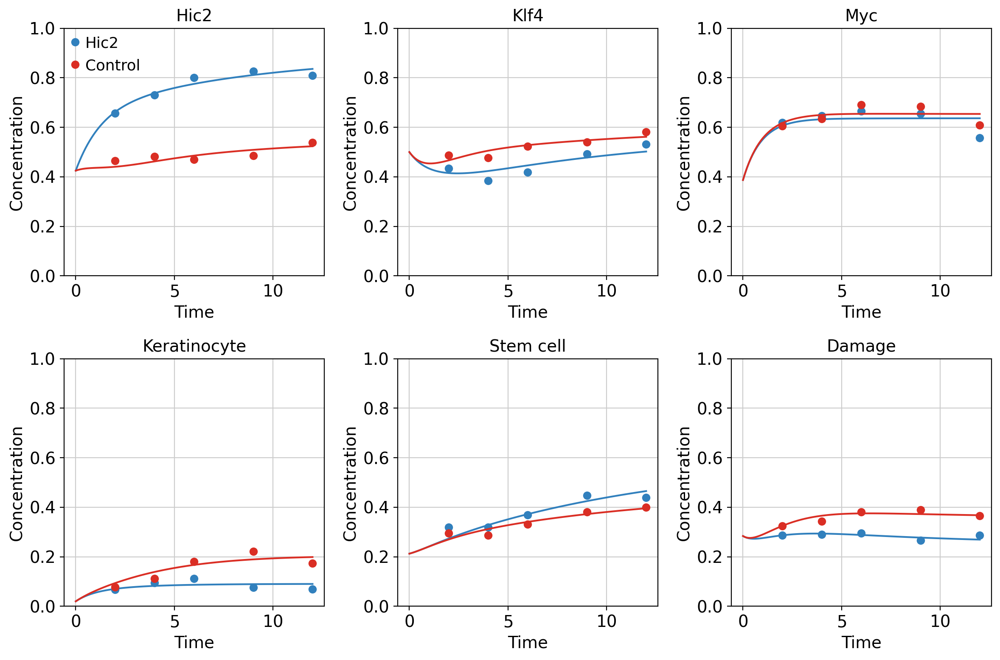

In [203]:
compare_deterministic(initial_parameters_stochastic)

# Stochastic parameter optimization

In [66]:
# Parameter optimization with parallelization

initial_sigma = 0.2

cma_options = {
    "bounds": [lower_bounds, upper_bounds],
    "seed": 0,
    "maxfevals": 100000,
    "popsize": 32, 
    "verbose": 1
}

# instantiate a thread pool executor
# letting it default to the number of logical processors on your machine
with concurrent.futures.ThreadPoolExecutor() as executor:
    
    # define a wrapper function that cma will call
    # it takes a list of parameter arrays and returns a list of cost values
    def parallel_evaluation(solutions):
        return list(executor.map(evaluate_parameters, solutions))

    # execute the optimization loop
    # note that objective_function is set to None when using parallel_objective
    best_parameters, evolution_strategy = cma.fmin2(
        objective_function=None,
        x0=initial_parameters_stochastic,
        sigma0=initial_sigma,
        options=cma_options,
        parallel_objective=parallel_evaluation
    )

print("optimization completed.")
print("best function value: ", evolution_strategy.result.fbest)
print("optimal parameter array: ", best_parameters)

(16_w,32)-aCMA-ES (mu_w=9.2,w_1=19%) in dimension 66 (seed=314914, Tue Apr 14 17:21:08 2026)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1     32 6.073408064294154e+00 1.0e+00 1.88e-01  3e-02  2e-01 0:02.7
    2     64 6.347675115489384e+00 1.0e+00 1.81e-01  3e-02  2e-01 0:03.2
    3     96 4.172160418378828e+00 1.0e+00 1.77e-01  3e-02  2e-01 0:03.7
    7    224 3.168754493931427e+00 1.1e+00 1.66e-01  3e-02  2e-01 0:06.9
   16    512 5.951066456586386e+00 1.2e+00 1.49e-01  2e-02  2e-01 0:11.2
   27    864 5.024274399167361e+00 1.3e+00 1.46e-01  2e-02  1e-01 0:16.3
   40   1280 3.213291834720845e+00 1.4e+00 1.23e-01  2e-02  1e-01 0:22.7
   53   1696 2.132704005089245e+00 1.4e+00 1.10e-01  2e-02  1e-01 0:30.2
   68   2176 1.204742274463315e+00 1.5e+00 1.12e-01  2e-02  1e-01 0:40.0
   86   2752 1.348850587362997e+00 1.6e+00 1.13e-01  2e-02  1e-01 0:49.4
  100   3200 2.650101369944938e+00 1.7e+00 1.13e-01  2e-02  1e-01 0:56.0
  124   3968 1.912217440785702e+

In [67]:
# Save parameters

numpy.savetxt("parameters_iterations_30000+100000_popsize_32_version_3.txt", best_parameters)

In [ ]:
# Load parameters

best_parameters = numpy.loadtxt("parameters_iterations_30000+100000_popsize_32_version_3.txt")

best_control = best_parameters.copy()
best_control[beta_H_index] = 0

# Test parameters

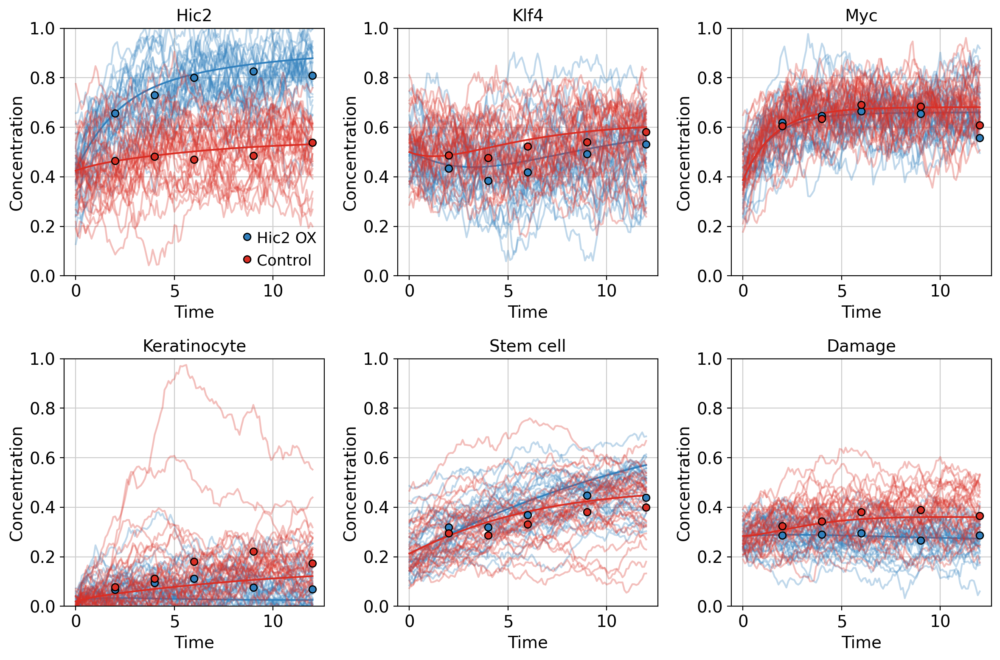

In [204]:
compare_stochastic_trajectories(best_parameters)

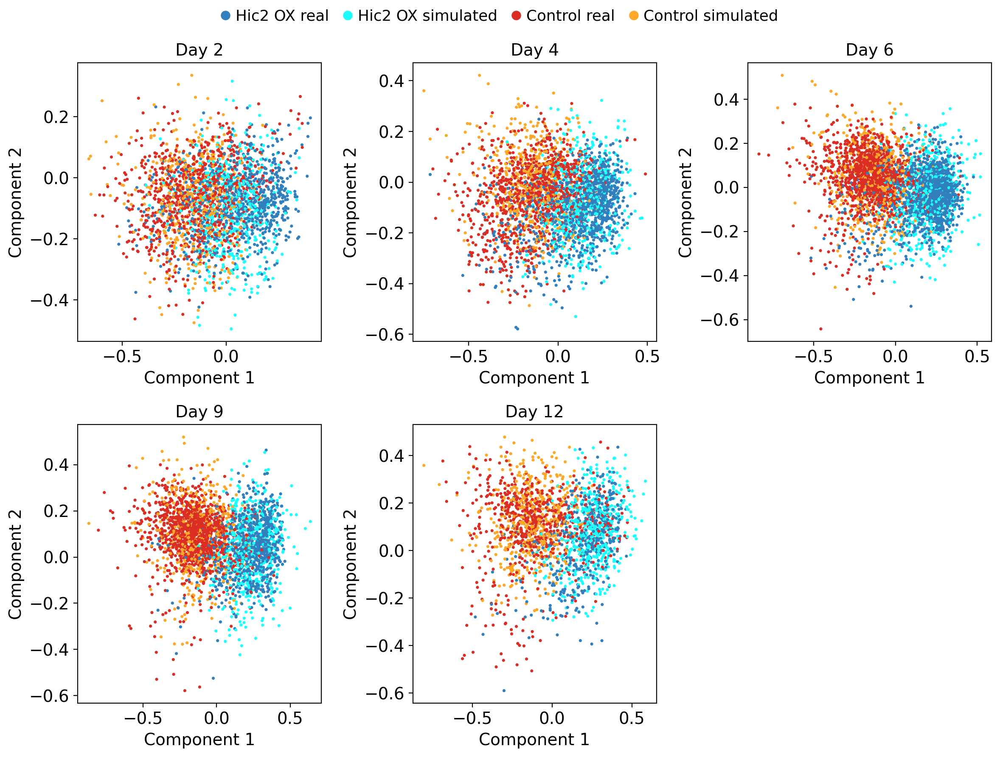

In [239]:
compare_pca(best_parameters)

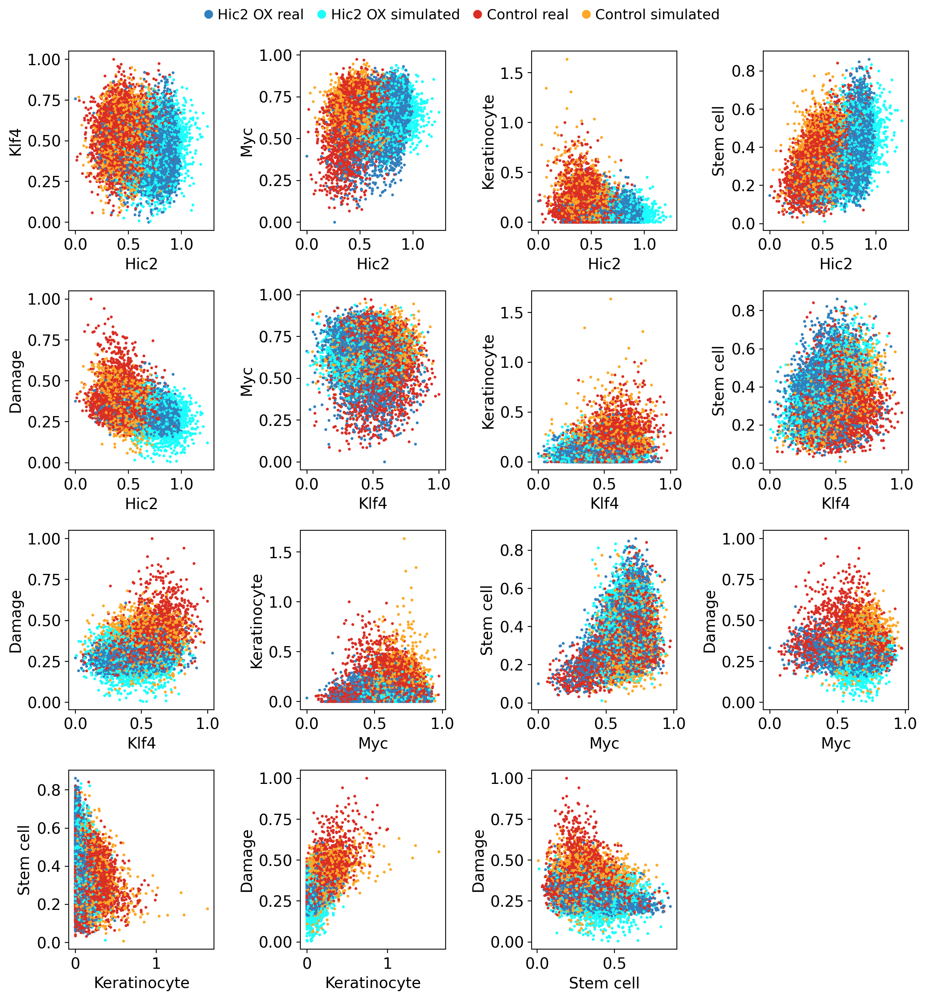

In [242]:
compare_2d(best_parameters)

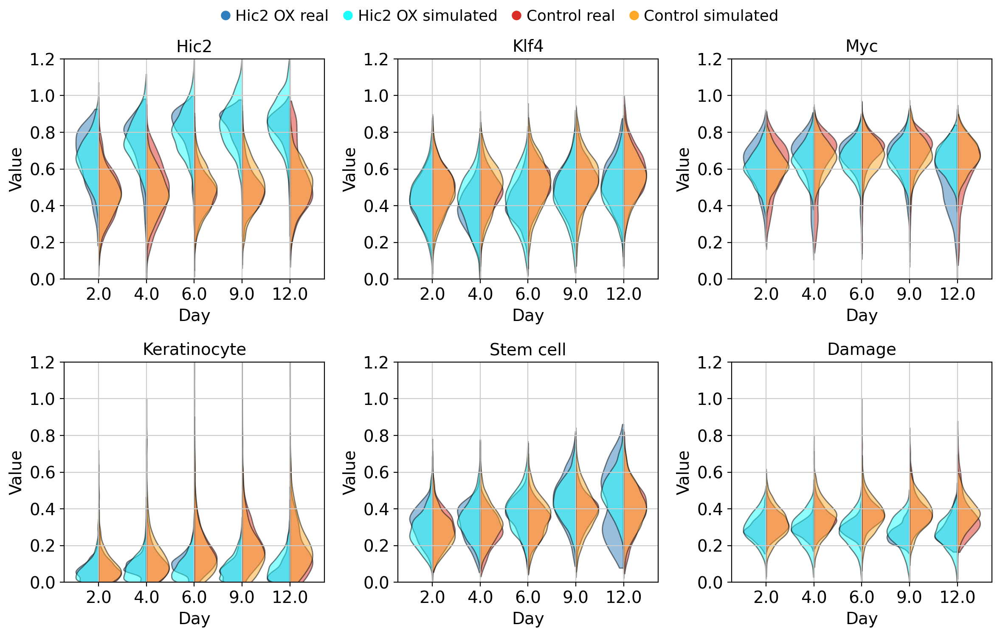

In [250]:
compare_violin(best_parameters)